
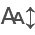

In [1]:
import os
import sys
import numpy as np
import scipy as sp
from importlib import reload
import matplotlib.pyplot as plt
from matplotlib import colors
import pandas as pd
import json
from itables import init_notebook_mode
init_notebook_mode(all_interactive=True)

from Block_analysis import *
import small_utilities
reload( small_utilities)
from small_utilities import *

import seaborn as sns

import mdtraj as md

In [2]:
def markers_colors():
        
    import matplotlib
    cm = plt.get_cmap('tab20')
    colors = cm(np.linspace(0, 1, 20))
    # np.array([i for i in matplotlib.markers.MarkerStyle.markers.keys()])[:-4]
    
    return np.array(colors), np.array([i for i in matplotlib.markers.MarkerStyle.markers.keys() if i not in ['None', 'none', ' ', '', ',']])

def _plot_cm_all(input:dict, cbar_label:str, file_name:str=None, save_fig:bool = False, show_fig:bool = False, title_dict:dict = None, offset=None,
                plot_args_in:dict = {'vmin': 0.0, 'vmax': 0.5, 'fig_size': (30,14), 'cax_coor': None, 'cmap': 'jet', 'aspect' : 'auto', 'rotation' : {'x' : 90, 'y' :0},
                                  'tick_size' : {'x' : 18, 'y' : 18, 'cax' :25}, 'label_size' : {'x' : 30, 'y' : 30, 'cax' :30}, 'title_size' :20, 'dpi' : 310, 'labels' : {'x' :"Residues", 'y':"Residues" },
                                  'nrows' : 2, 'ncols' : 5, 'xticks' : None, 'yticks' : None, 'tick_interval' : 2}):
        import matplotlib.pyplot as plt
        from mpl_toolkits.axes_grid1 import make_axes_locatable
        # [0.93, 0.2, 0.02, 0.6] defult cax

        plot_args:dict = {'vmin': 0.0, 'vmax': 0.5, 'fig_size': (30,14), 'cax_coor': None, 'cmap': 'jet', 'aspect' : 'auto', 'rotation' : {'x' : 90, 'y' :0},
                            'tick_size' : {'x' : 18, 'y' : 18, 'cax' :25}, 'label_size' : {'x' : 30, 'y' : 30, 'cax' :30}, 'title_size' :20, 'dpi' : 310, 'labels' : {'x' :"Residues", 'y':"Residues" },
                            'nrows' : 2, 'ncols' : 5, 'xticks' : None, 'yticks' : None, 'tick_interval' : 2}
        
        if plot_args_in :

            for k in plot_args.keys():

                if k in plot_args_in.keys() : plot_args[k] = plot_args_in[k]

        fig, axes = plt.subplots(plot_args['nrows'],plot_args['ncols'], figsize=plot_args['fig_size'], sharex=True, sharey=True, dpi=610, layout='constrained')
        images=[]
        for i in input.keys():
            # ax.set_axis_off()

            p,q = np.unravel_index(i,(plot_args['nrows'], plot_args['ncols']))

            im = axes[p,q].imshow(np.array(input[i]), vmin=plot_args['vmin'], vmax=plot_args['vmax'],cmap=plot_args['cmap'], aspect=plot_args['aspect'])
            im.axes.tick_params(axis='both',which='both',direction='out')
            axes[p,q].invert_yaxis()
            axes[p,q].set_xticks(range(0, len(plot_args['xticks'])+(offset-1),plot_args['tick_interval']), plot_args['xticks'][::plot_args['tick_interval']], rotation=plot_args['rotation']['x'], size=plot_args['tick_size']['x'])
            axes[p,q].set_yticks(range(0, len(plot_args['yticks'])+(offset-1),plot_args['tick_interval']), plot_args['xticks'][::plot_args['tick_interval']], rotation=plot_args['rotation']['y'], size=plot_args['tick_size']['y'])
            axes[p,q].grid(False)
            axes[p,q].set_title(f"{title_dict[i]}",size=plot_args['title_size'], pad=10)


            # if not q : axes[p,q].set_ylabel(plot_args['labels']['y'], size=plot_args['label_size']['y'], labelpad=15)
            # if p == plot_args['nrows']-1 : axes[p,q].set_xlabel(plot_args['labels']['x'], size=plot_args['label_size']['x'], labelpad=15)
            images.append(im)

        if plot_args['cax_coor'] : cax= fig.add_axes(plot_args['cax_coor'])
        # else : cax = fig.add_axes([axes[plot_args['nrows']-1,plot_args['ncols']-1].get_position().x1+0.02,axes[plot_args['nrows']-1,plot_args['ncols']-1].get_position().y0,0.02,axes[0,0].get_position().y1-axes[plot_args['nrows']-1,plot_args['ncols']-1].get_position().y0])
        else : cax = fig.add_axes([axes[plot_args['nrows']-1,plot_args['ncols']-1].get_position().x1+0.12, axes[plot_args['nrows']-1,plot_args['ncols']-1].get_position().y0-0.034, 0.02, axes[0,0].get_position().y1-axes[plot_args['nrows']-1,plot_args['ncols']-1].get_position().y0+0.134])
        # else : 
        #     divider = make_axes_locatable(axes[0,0])
        #     cax = divider.append_axes("right", size="5%", pad=0.05)
            # plt.colorbar(im, cax=cax)
            
        cbar = fig.colorbar(images[-1],cax=cax)
        cbar.set_label(cbar_label, size=plot_args['label_size']['cax'])
        cbar.ax.tick_params(labelsize=plot_args['tick_size']['cax'])
        # cbar.set_ticks([])
        # cbar.set_ticklabels([])

        # fig.text(0.5, 0.04, plot_args['labels']['x'], ha="center", fontsize=plot_args['label_size']['x'])
        # fig.text(-0.05, 0.5, plot_args['labels']['y'], va="center", rotation="vertical", fontsize=plot_args['label_size']['y'])

        fig.supxlabel(plot_args['labels']['x'], size=plot_args['label_size']['x'])
        fig.supylabel(plot_args['labels']['y'], size=plot_args['label_size']['y'])
        
        # plt.tight_layout()
        # plt.grid(alpha=0.1)
        if show_fig : plt.show()

        if save_fig : assert file_name ; out_f = f"{file_name}" ; print(f'saving figure {file_name}!');plt.savefig(out_f, dpi=plot_args['dpi'],bbox_inches='tight')
        else : pass

def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=("black", "white"),
                     threshold=None, **textkw):
    import matplotlib
    
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A pair of colors.  The first is used for values below a threshold,
        the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), size=18, **kw)
            texts.append(text)

    return texts

def contact_map_protein_rw(trj, weights:list=[], cutoff:float=1.2, apo:bool=False):

    import numpy as np
    import mdtraj as md
    
    """
    Compute a reweighted contact map and distance matrix for protein-protein interactions.
    
    Parameters:
    trj : mdtraj.Trajectory
        The trajectory containing the protein atoms.
    weights : list or np.ndarray
        Normalized weights for reweighting the contacts (if provided).
    cutoff : float
        Distance cutoff for contact definition in nm.
    apo : bool
        If True, uses all residues; if False, excludes the last residue.
        
    Returns:
    np.ndarray
        Reweighted contact map.
    """
    # Determine the number of residues
    p_residues = trj.topology.n_residues - 1 if not apo else trj.topology.n_residues

    # Generate upper triangle indices for residue pairs
    indices = np.stack(np.triu_indices(p_residues, 1), axis=1)

    # Compute distances between residue pairs across all frames
    dist_array = np.array(md.compute_contacts(trj, indices)[0]).astype(float)

    # Identify contacts based on cutoff
    contact_array = np.where(dist_array < cutoff, 1, 0)

    # Initialize contact and distance matrices
    distance_matrix = np.zeros((p_residues, p_residues))
    contact_matrix = np.zeros((p_residues, p_residues))

    if len(weights) > 0:
        # Ensure weights are normalized
        weights = np.array(weights) / np.sum(weights)

        # Reweighting contacts and distances
        reweighted_distances = np.dot(weights, dist_array)  # Reweight distances across frames
        reweighted_contacts = np.dot(weights, contact_array)  # Reweight contacts across frames

        # Fill the upper triangle of the matrices with the reweighted values
        distance_matrix[indices[:, 0], indices[:, 1]] = reweighted_distances
        contact_matrix[indices[:, 0], indices[:, 1]] = reweighted_contacts
    else:
        # Compute mean values without reweighting
        distance_matrix[indices[:, 0], indices[:, 1]] = dist_array.mean(axis=0)
        contact_matrix[indices[:, 0], indices[:, 1]] = contact_array.mean(axis=0)

    # Make matrices symmetric
    distance_matrix += distance_matrix.T
    contact_matrix += contact_matrix.T

    return np.array(contact_matrix).astype(float)  # , np.array(distance_matrix).astype(float)

def contact_map_ligand_rw_2(trj, ps:int, pe:int, ligand_res_index:int, weights:list=[], cutoff=0.6):
    import numpy as np
    import mdtraj as md 
    
    """
    Compute a reweighted dual contact map for ligand-protein interactions.
    
    Parameters:
    trj : mdtraj.Trajectory
        The trajectory containing protein and ligand atoms.
    ps : int
        Starting residue index for the protein.
    pe : int
        Ending residue index for the protein.
    ligand_res_index : int
        Residue index of the ligand.
    weights : list or np.ndarray
        Normalized weights for reweighting the contacts (if provided).
    cutoff : float
        Distance cutoff for contact definition in nm.
        
    Returns:
    np.ndarray
        Reweighted dual contact map.
    """
    
    # Create pairs for computing contacts (protein residues with ligand)
    pairs = np.array([[i, ligand_res_index] for i in range(ps, pe+1)])

    # Compute distances between protein-ligand pairs for all frames
    dists = np.asarray(md.compute_contacts(trj, pairs, scheme='closest-heavy')[0]).astype(float)

    # Identify contacts (1 if within cutoff distance, otherwise 0)
    contacts = np.where(dists < cutoff, 1, 0)

    if len(weights) > 0:
        # Normalize weights if not already normalized
        weights = np.array(weights) / np.sum(weights)
        
        # Reweight contacts by applying weights to each frame
        reweighted_contacts = contacts * weights[:, np.newaxis]
        
        # Compute reweighted dual contact map
        dual = (reweighted_contacts.T @ contacts) / np.sum(weights)
    else:
        # If no weights provided, compute dual contact map without reweighting
        dual = (contacts.T @ contacts) / len(contacts)

    return dual

def free_energy_2D_blockerror(Y, X, bins=None, T:int=None, y0:float=None, ymax:float=None, x0:float=None,
                   xmax:float=None, weights=None, blocks=10):
    
    histo, xedges, yedges = np.histogram2d(
        Y, X, bins, [[y0, ymax], [x0, xmax]], density=True, weights=weights
    )
    # max = np.max(histo)
    # free_energy=-(0.001987*T)*np.log(histo)
    free_energy = -(0.001987*T)*np.log(np.flipud(histo)+.000001)
    free_energy = free_energy-np.min(free_energy)

    xcenters = xedges[:-1] + np.diff(xedges)/2
    ycenters = yedges[:-1] + np.diff(yedges)/2

    Ind = chunkIt(len(Y), blocks)
    block_size = (Ind[0][1]-Ind[0][0])
    hist_blocks = []
    # for i in range(0, len(Ind)):
    for i in np.arange(0, blocks):

        block_data_Y = Y[Ind[i][0]:Ind[i][1]]
        block_data_X = X[Ind[i][0]:Ind[i][1]]

        if weights is not None: block_weights = weights[Ind[i][0]:Ind[i][1]]
        else: block_weights = None

        hist, xedges, yedges = np.histogram2d(
            block_data_Y, block_data_X, bins, [[y0, ymax], [x0, xmax]], density=True, weights=block_weights
        )
        # hist, binedges = np.histogram(block_data, bins=bins, range=[
        #                             x0, xmax], density=True, weights=weights[Ind[i][0]:Ind[i][1]])
        hist_blocks.append(hist)
        
    hist_blocks = np.array(hist_blocks)
    average = np.average(hist_blocks, axis=0)
    variance = np.var(hist_blocks, axis=0)
    N = len(hist_blocks)
    error = np.sqrt(variance / N)
    ferr = -(0.001987*T)*(error / average)

    return free_energy, xcenters, ycenters, ferr, error

def adjust_min(x):
    idx = (x == 0)
    x[idx] = x[~idx].min()
    return x

In [3]:
sequence=  ['ASP121', 'ASN122', 'GLU123', 'ALA124', 'TYR125', 'GLU126', 'MET127', 'PRO128', 'SER129', 'GLU130', 'GLU131', 'GLY132', 'TYR133', 'GLN134', 'ASP135',
'TYR136', 'GLU137', 'PRO138', 'GLU139', 'ALA140']

w_dir= '/data/jk_ssREST3_repo_data/data/'

data_list_lig47= [f"{w_dir}/REST2/data_lig47_10/", # 0
                f"{w_dir}/REST2/data_lig47_20/", # 1
                f"{w_dir}/ssREST3/data_lig47_8/", # 2
                f"{w_dir}/ssREST3/data_lig47_16/"] # 3


legend_title= ['REST2 (10)', 'REST2 (20)', 'ssREST3 (08)', 'ssREST3 (16)']

color, marker = markers_colors()

temperature={ 0 : compute_temperatures((300, 450), 10),
              1 : compute_temperatures((300, 600), 20),
              2 : compute_temperatures((300, 450), 8),
              3 : compute_temperatures((300, 450), 16)}

ticks_pnum, ticks_pname = sequence_ticks_1(sequence)

nrep=[10, 20, 8, 16]

In [4]:
files = os.listdir(data_list_lig47[2])

# Filter out JSON files
json_files = np.array([file for file in files if file.endswith('.json')])

print(json_files)

['aro_interactions.json' 'hyphob_interactions.json' 'sheet_contant.json'
 'kd_bf_time.json' 'contact_matrix.json' 'alphabeta_ppII.json'
 'hyphob_interactions_bf.json' 'agreegate_kd_bf.json' 'pp.json'
 'l_contact_map.json' 'agreegate_cm.json' 'p_contact_map.json'
 'charge_contact_fraction.json' 'kd.json' 'hbond_interactions_bf.json'
 'charge_contact_fraction_bf.json' 'alphabeta_betasheet.json' 'rg.json'
 'hbond_interactions.json' 'avg_ligand_contacts.json' 'helix_contant.json'
 'sa.json' 'alphabeta_alpharight.json' 'bend_angle.json'
 'aro_interactions_bf.json' 'bound_fraction.json']


In [5]:
files = ['rg.json', 'helix_contant.json', 'sheet_contant.json', 'p_contact_map.json', 'l_contact_map.json', 'bend_angle.json', 'replica_temp.xvg','replica_index.xvg',
         'aro_interactions_bf.json', 'charge_contact_fraction_bf.json', 'hbond_interactions_bf.json', 'hyphob_interactions_bf.json',
         'kd_bf_time.json', 'kd.json', 'bound_fraction.json', 'agreegate_kd_bf.json', 'contact_matrix.json',]

rg=load_json(f'{data_list_lig47[2]}/{files[0]}')
helix=load_json(f'{data_list_lig47[2]}/{files[1]}')
sheet=load_json(f'{data_list_lig47[2]}/{files[2]}')
p_cm=load_json(f'{data_list_lig47[2]}/{files[3]}')
l_cm=load_json(f'{data_list_lig47[2]}/{files[4]}')
ba=load_json(f'{data_list_lig47[2]}/{files[5]}')

xvg_temp=np.loadtxt(f'{data_list_lig47[2]}/{files[6]}', comments=['#','@'])
xvg_index=np.loadtxt(f'{data_list_lig47[2]}/{files[7]}', comments=['#','@'])

aro=load_json(f'{data_list_lig47[2]}/{files[8]}')
charge=load_json(f'{data_list_lig47[2]}/{files[9]}')
hbond=load_json(f'{data_list_lig47[2]}/{files[10]}')
hyphob=load_json(f'{data_list_lig47[2]}/{files[11]}')
kd_time=load_json(f'{data_list_lig47[2]}/{files[12]}')
kd=load_json(f'{data_list_lig47[2]}/{files[13]}')
bf=load_json(f'{data_list_lig47[2]}/{files[14]}')
ag_kd=load_json(f'{data_list_lig47[2]}/{files[15]}')
cm=load_json(f'{data_list_lig47[2]}/{files[16]}')


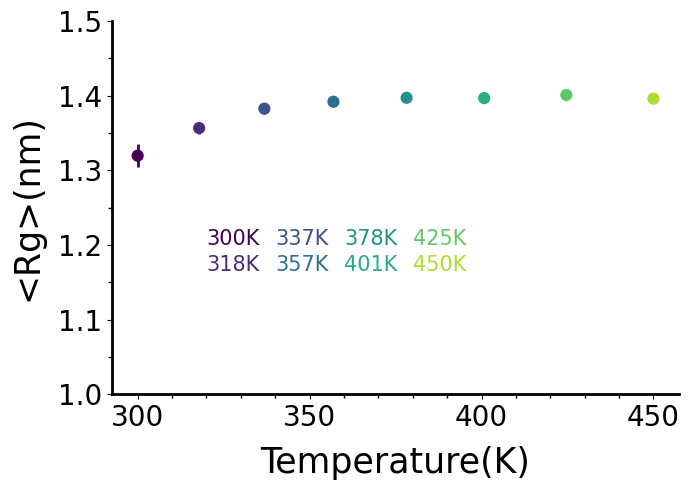

In [6]:
fig, ax = plt.subplots(figsize=(7,5))

ax.scatter(temperature[2],[get_blockerror_pyblock_nanskip(np.array(rg[f'rep:{i}']))[0] for i in range(nrep[2])], s=60, c=[plt.cm.viridis(i/nrep[2]) for i in range(nrep[2])])
ax.errorbar(temperature[2],[get_blockerror_pyblock_nanskip(np.array(rg[f'rep:{i}']))[0] for i in range(nrep[2])], elinewidth=2, 
            yerr=[get_blockerror_pyblock_nanskip(np.array(rg[f'rep:{i}']))[1] for i in range(nrep[2])], ecolor=[plt.cm.viridis(i/nrep[2]) for i in range(nrep[2])], ls='none')

ax.tick_params(labelsize=20)
ax.set_yticks(np.arange(1.0,1.55,0.1),[f"{i:2.1f}" for i in np.arange(1.0,1.55,0.1)])
ax.set_xticks(np.arange(300,500,50), np.arange(300,500,50))
ax.set_xlabel("Temperature(K)", labelpad=10, size=25)
ax.set_ylabel("<Rg>(nm)", labelpad=10, size=25)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(50/5))
ax.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.1/2))
ax.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

y=1.2
x=320
for i in range(len(temperature[2])):
        
    ax.text(x, y, f"{round(temperature[2][i])}K", size=15, color=plt.cm.viridis(i/nrep[2]))
    y=y-0.035
    if i%2 : x = x+20 ; y=1.2

plt.tight_layout()

plt.tight_layout()

# plt.savefig('./rg_temp.png', dpi=610)

In [6]:
timestep= 80
time=np.zeros(len(rg['rep:0']))

for i in range(len(rg['rep:0'])):
    time[i]=(i*timestep)/(10**6)

time


array([0.00000e+00, 8.00000e-05, 1.60000e-04, ..., 1.06936e+00,
       1.06944e+00, 1.06952e+00])

In [8]:
magic_num=125
time_split=[]
c=0

for i in range(10,510,10):
    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]

    if c in time_split : break

    time_split.append(c)
    
    print(i, c, last)

10 1251 0.1
20 2501 0.2
30 3751 0.3
40 5001 0.4
50 6251 0.5
60 7501 0.6
70 8751 0.7
80 10001 0.8
90 11251 0.9
100 12501 1.0
110 13370 1.06952


/home/jayakrishna/work/scripts/analysis_class/Block_analysis.py:90: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)


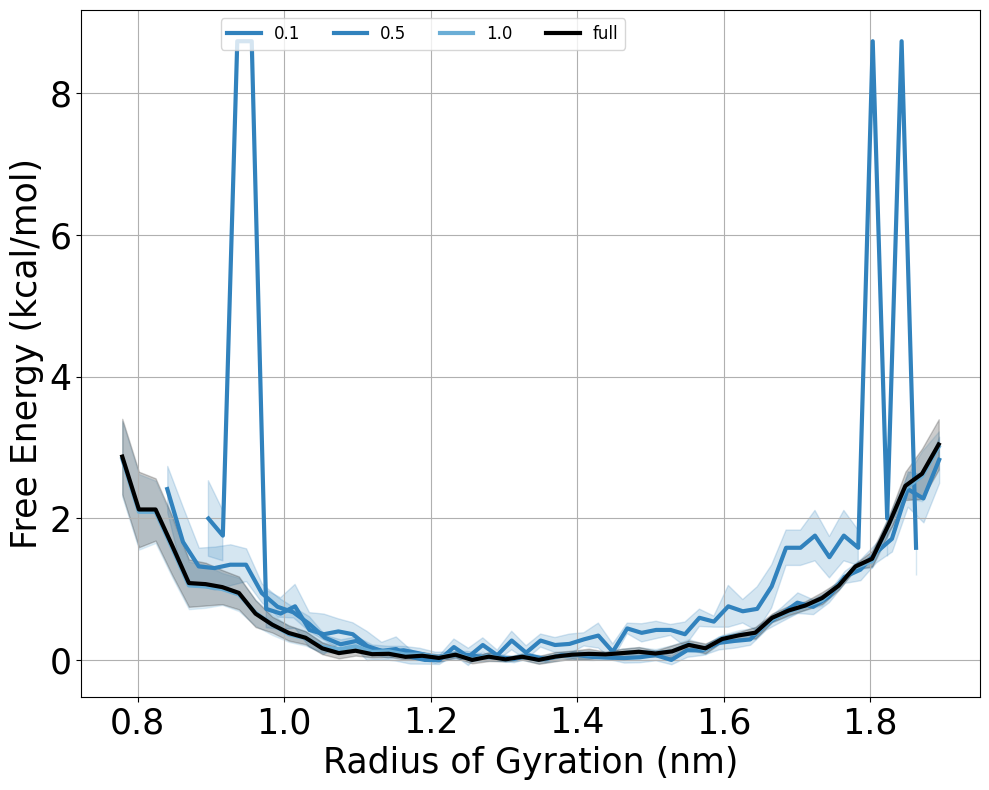

In [9]:
splits=[10, 50, 100]
magic_num=125

plt.figure(figsize=(10,8))

for i in splits :
        
    dG1, bin_centers, ferr = free_energy_1D_blockerror(rg['rep:0'][:int(magic_num*i)+1], T=300, x0=min(rg['rep:0'][:int(magic_num*i)+1]), xmax=max(rg['rep:0'][:int(magic_num*i)+1]), bins=50, blocks=5, weights=None)
    sns.lineplot(x=bin_centers, y=dG1, color=plt.cm.tab20c(int(i/100)), linewidth=3,label=str(i/100), linestyle='-')
    plt.fill_between(bin_centers, dG1-ferr, dG1+ferr, color=plt.cm.tab20c(int(i/100)), alpha=0.2)

dG1, bin_centers, ferr = free_energy_1D_blockerror(rg['rep:0'], T=300, x0=min(rg['rep:0']), xmax=max(rg['rep:0']), bins=50, blocks=5, weights=None)
sns.lineplot(x=bin_centers, y=dG1, color='k', linewidth=3,label='full', linestyle='-')
plt.fill_between(bin_centers, dG1-ferr, dG1+ferr, color='k', alpha=0.2)

# plt.ylim(-0.2, 6)
# plt.xlim(0.5, 2.25)
plt.xlabel('Radius of Gyration (nm)', size=25)
plt.ylabel('Free Energy (kcal/mol)', size=25)
plt.legend(loc='upper center', fontsize=12, ncol=5, bbox_to_anchor=(0.38, 1.0))
plt.xticks(fontsize=25)
plt.yticks(fontsize=25)
#plt.title(f"Replica : {val}", size=20)
plt.tight_layout()
plt.grid()
plt.show()   

In [10]:
magic_num=125
time_split=[]
c=0
K=[]
time_agg=[]
Rg_agg=[]

for i in range(10,510,10):
    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    time_agg.append(last)
    
    if c in time_split : break

    time_split.append(c)
    Rg_agg.append(get_blockerror_pyblock_nanskip(np.array(rg['rep:0'][:int(magic_num*i)+1])))
    
    # print(i, c, last, kd_bf_data[0])
    # print(f"Time ==> {last} microsec; Total frames ==> {c}; Rg ==> {Rg_agg[int(i/10)-1][0]:0.4f}; Rg_err ==> {Rg_agg[int(i/10)-1][1]:0.4f}")

Rg_agg=np.array(Rg_agg)
time_agg=np.array(time_agg[:-1])


Text(0, 0.5, '<Rg> (nm)')

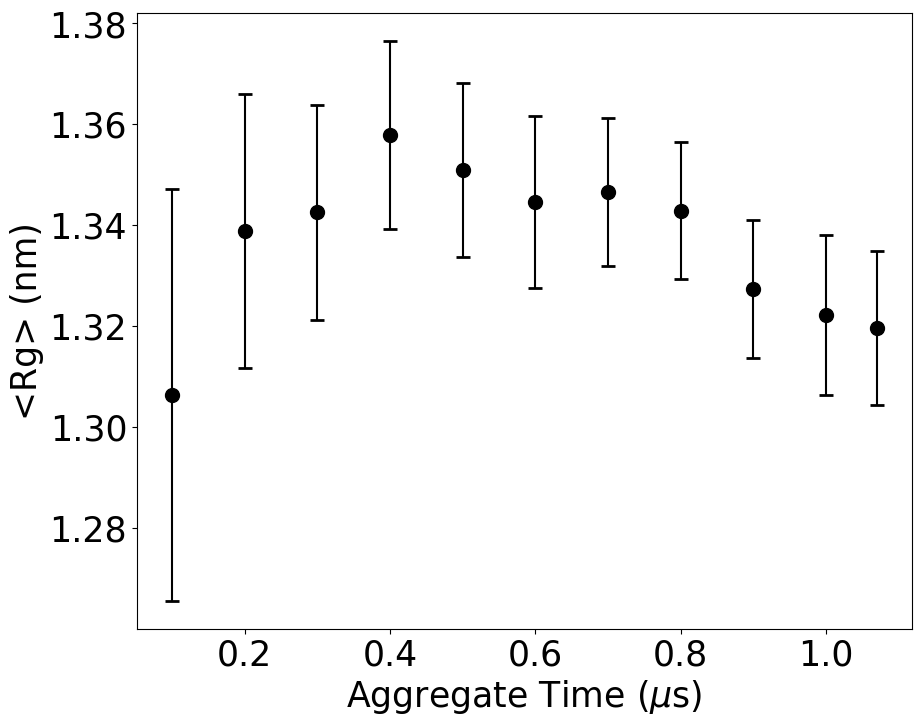

In [11]:
plt.figure(figsize=(10,8))

plt.errorbar(time_agg, Rg_agg.T[0], yerr=Rg_agg.T[1], fmt='o', color='black', markersize=10, capsize=5, capthick=2)

plt.tick_params(labelsize=25)
plt.xlabel(r'Aggregate Time ($\mu$s)', size=25)
plt.ylabel(r'<Rg> (nm)', size=25)

<Figure size 1500x500 with 0 Axes>

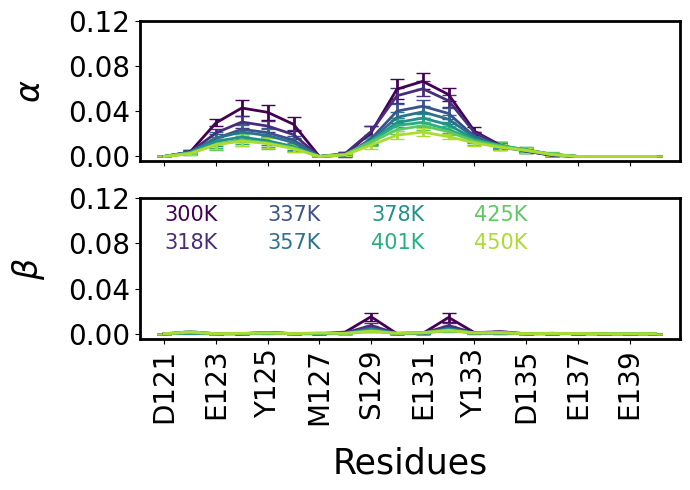

In [7]:
in_dict={int(i.split(':')[1]):helix[i] for i in helix.keys() if 'rep' in i}
in_dict_2={int(i.split(':')[1]):sheet[i] for i in sheet.keys() if 'rep' in i}

plt.figure(figsize=(15,5))

fig, axes = plt.subplots(2,1, figsize=(7,5), sharex=True, sharey=True)

for i in in_dict.keys():
        
    axes[0].errorbar(ticks_pnum, np.array(in_dict[i]).T[0], yerr=np.array(in_dict[i]).T[1], color=plt.cm.viridis(i/nrep[2]), lw=2, capsize=5)
    axes[1].errorbar(ticks_pnum, np.array(in_dict_2[i]).T[0], yerr=np.array(in_dict_2[i]).T[1], color=plt.cm.viridis(i/nrep[2]), lw=2, capsize=5)

axes[0].tick_params(labelsize=20)
axes[0].set_ylabel(r'$\alpha$', size=24,labelpad=15)

axes[1].tick_params(labelsize=20)
axes[1].set_xticks(range(0,20,2), ticks_pnum[::2],rotation=90)
axes[1].set_yticks(np.arange(0,0.14,0.04))
axes[1].set_xlabel('Residues', size=25, labelpad=15)
axes[1].set_ylabel(r'$\beta$', size=24,labelpad=15)



y=0.1
x=0
for i in range(len(temperature[2])):
        
    axes[1].text(x, y, f"{round(temperature[2][i])}K", size=15, color=plt.cm.viridis(i/nrep[2]))
    y=y-0.025
    if i%2 : x = x+4 ; y=0.1

for ax in axes.flat:
    for spines in ax.spines.values():
        spines.set_linewidth(2)
        
        
plt.tight_layout()

# plt.savefig('./ss.png', dpi=610)


In [8]:
plot_args={'vmin': 0.0,
           'vmax': 0.5,
           'fig_size': (10,18),
        #    'cax_coor': [.92, .11, .03, .77],
           'cmap': 'jet',
           'aspect' : 'auto',
           'rotation' : {'x' : 90, 'y' :0},
           'tick_size' : {'x' : 28, 'y' : 28, 'cax' :30},
           'label_size' : {'x' : 38, 'y' : 38, 'cax' :36},
           'title_size' :28,
           'dpi' : 210,
           'labels' : {'x' :"Residues", 'y':"Residues" },
           'nrows' : 4,
           'ncols' : 2,
           'xticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'yticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'tick_interval' : 1}

in_dict={int(i.split(':')[1]):p_cm[i] for i in p_cm.keys() if 'rep' in i}
_plot_cm_all(in_dict, 'Contact Fraction', show_fig=True, title_dict=[f'{round(temperature[2][i])}K' for i in range(nrep[2])], offset=1, 
             plot_args_in=plot_args)
# plt.savefig('./p_cm.png',dpi=610)

In [9]:
plot_args={'vmin': 0.0,
           'vmax': 0.5,
           'fig_size': (10,18),
        #    'cax_coor': [.92, .11, .03, .77],
           'cmap': 'jet',
           'aspect' : 'auto',
           'rotation' : {'x' : 90, 'y' :0},
           'tick_size' : {'x' : 28, 'y' : 28, 'cax' :30},
           'label_size' : {'x' : 38, 'y' : 38, 'cax' :36},
           'title_size' :28,
           'dpi' : 210,
           'labels' : {'x' :"Residues", 'y':"Residues" },
           'nrows' : 4,
           'ncols' : 2,
           'xticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'yticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'tick_interval' : 1}

in_dict={int(i.split(':')[1]):l_cm[i] for i in l_cm.keys() if 'rep' in i}
_plot_cm_all(in_dict, 'Contact Fraction', show_fig=True, title_dict=[f'{round(temperature[1][i])}K' for i in range(nrep[1])], offset=1, 
             plot_args_in=plot_args)
# plt.savefig('./l_cm.png',dpi=610)

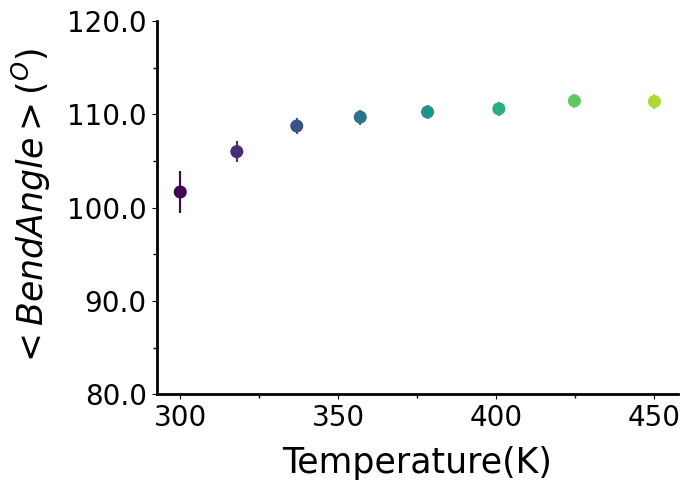

In [10]:
fig, ax = plt.subplots(figsize=(7,5))

ax.scatter(temperature[2],[ba[f'rep:{i}'][0] for i in range(nrep[2])], s=70, c=[plt.cm.viridis(i/nrep[2]) for i in range(nrep[2])])
ax.errorbar(temperature[2],[ba[f'rep:{i}'][0] for i in range(nrep[2])], yerr=[ba[f'rep:{i}'][1] for i in range(nrep[2])], ecolor=[plt.cm.viridis(i/nrep[2]) for i in range(10)], ls='none')

ax.tick_params(labelsize=20)
ax.set_yticks(np.arange(80,130,10),[f"{i:2.1f}" for i in np.arange(80,130,10)])
ax.set_xticks(np.arange(300,500,50), np.arange(300,500,50))
ax.set_xlabel("Temperature(K)", labelpad=10, size=25)
ax.set_ylabel(r"$<Bend Angle>(^{O})$", labelpad=10, size=25)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)

plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(50/2))
ax.tick_params(axis='x', which='minor', length=3, width=1, color='k', direction='out')
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(10/2))
ax.tick_params(axis='y', which='minor', length=3, width=1, color='k', direction='out')

plt.tight_layout()

# plt.savefig('./rg_temp.png', dpi=610)

/tmp/ipykernel_352517/1757865025.py:46: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


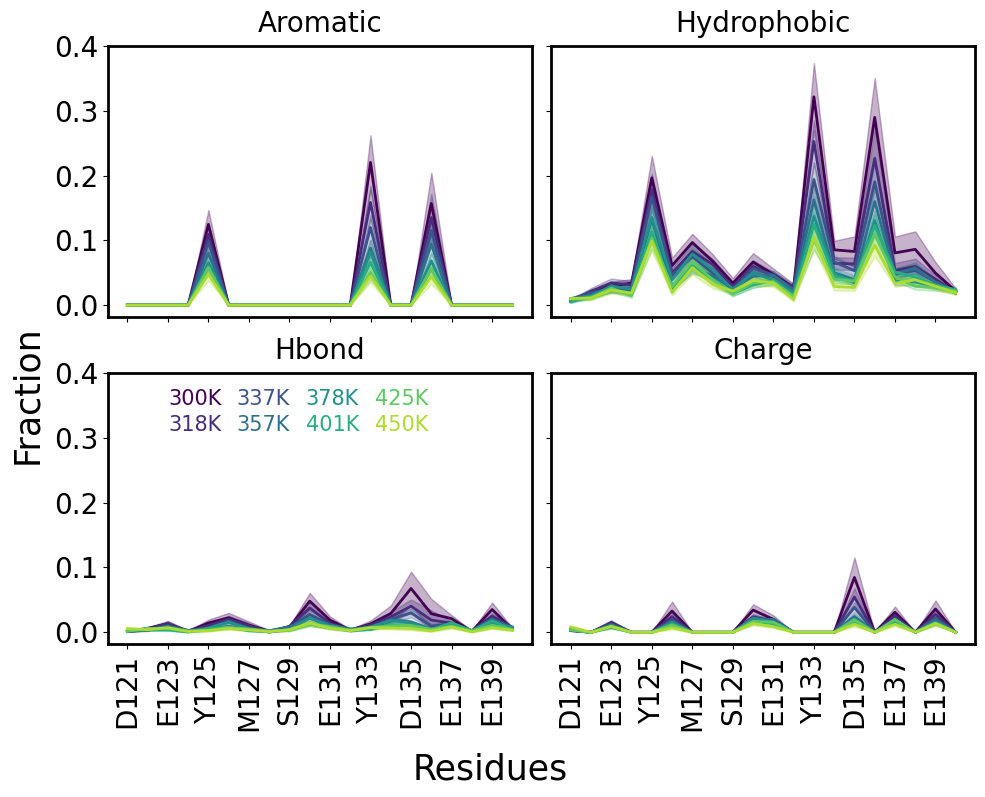

In [11]:
fig, axes = plt.subplots(2, 2, figsize=(10,8), sharex=True, sharey=True, layout='constrained')

title_list = ['Aromatic', 'Hydrophobic', 'Hbond', 'Charge']

for i in range(nrep[2]):

    axes[0,0].tick_params(labelsize=20)
    axes[0,0].plot(np.array(aro[f'rep:{i}']).T[0], np.array(aro[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[2]), lw=2)
    axes[0,0].fill_between(np.array(aro[f'rep:{i}']).T[0], np.array(aro[f'rep:{i}']).T[1]-np.array(aro[f'rep:{i}']).T[2], np.array(aro[f'rep:{i}']).T[1]+np.array(aro[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[2]), alpha=0.3)

    axes[0,1].tick_params(labelsize=20)
    axes[0,1].plot(np.array(hyphob[f'rep:{i}']).T[0], np.array(hyphob[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[2]), lw=2)
    axes[0,1].fill_between(np.array(hyphob[f'rep:{i}']).T[0], np.array(hyphob[f'rep:{i}']).T[1]-np.array(hyphob[f'rep:{i}']).T[2], np.array(hyphob[f'rep:{i}']).T[1]+np.array(hyphob[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[2]), alpha=0.3)

    axes[1,0].tick_params(labelsize=20)
    axes[1,0].plot(np.array(hbond[f'rep:{i}']).T[0], np.array(hbond[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[2]), lw=2)
    axes[1,0].fill_between(np.array(hbond[f'rep:{i}']).T[0], np.array(hbond[f'rep:{i}']).T[1]-np.array(hbond[f'rep:{i}']).T[2], np.array(hbond[f'rep:{i}']).T[1]+np.array(hbond[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[2]), alpha=0.3)

    axes[1,1].tick_params(labelsize=20)
    axes[1,1].plot(np.array(charge[f'rep:{i}']).T[0], np.array(charge[f'rep:{i}']).T[1], color=plt.cm.viridis(i/nrep[2]), lw=2)
    axes[1,1].fill_between(np.array(charge[f'rep:{i}']).T[0], np.array(charge[f'rep:{i}']).T[1]-np.array(charge[f'rep:{i}']).T[2], np.array(charge[f'rep:{i}']).T[1]+np.array(charge[f'rep:{i}']).T[2], color=plt.cm.viridis(i/nrep[2]), alpha=0.3)


for i in title_list : 
    p,q = np.unravel_index(title_list.index(i),(2,2))
    axes[p,q].set_title(i, size=20, pad=10)

    axes[p,q].set_xticks(np.array(aro[f'rep:0']).T[0][::2], ticks_pnum[::2], rotation=90)
    axes[p,q].set_yticks(np.arange(0,0.5,0.1), [f"{i:2.1f}" for i in np.arange(0,0.5,0.1)])
fig.supxlabel('Residues', size=25)
fig.supylabel('Fraction', size=25)

y=0.35
x=123
for i in range(len(temperature[2])):
        
    axes[1,0].text(x, y, f"{round(temperature[2][i])}K", size=15, color=plt.cm.viridis(i/nrep[2]))
    y=y-0.04
    if i%2 : x = x+3.4 ; y=0.35

for ax in axes.flat:
    for spines in ax.spines.values():
        spines.set_linewidth(2)
        

plt.tight_layout()


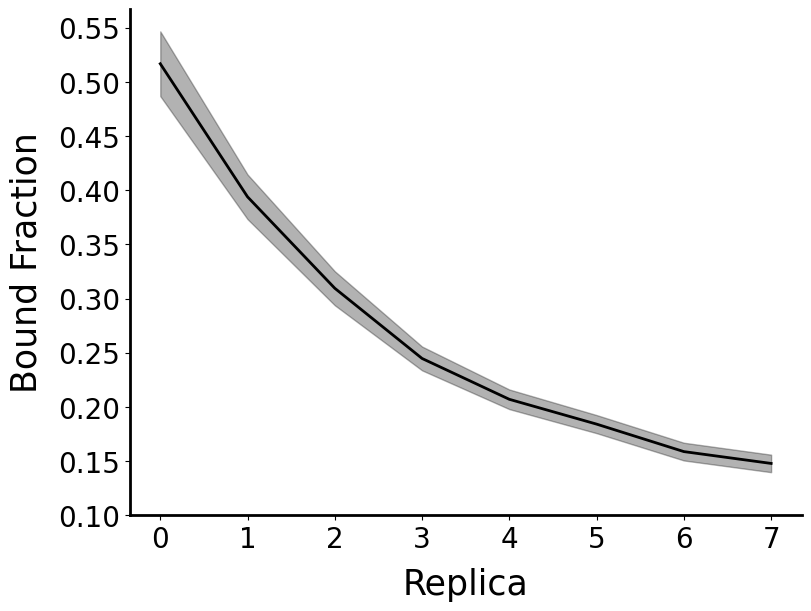

In [13]:
fig, axes = plt.subplots(1,1, figsize=(8,6), layout="constrained")

axes.plot(range(nrep[2]), np.array([bf[f'rep:{i}'] for i in range(nrep[2])]).T[0], lw=2, color='k')
axes.fill_between(range(nrep[2]), np.array([bf[f'rep:{i}'] for i in range(nrep[2])]).T[0]-np.array([bf[f'rep:{i}'] for i in range(nrep[2])]).T[1], 
                  np.array([bf[f'rep:{i}'] for i in range(nrep[2])]).T[0]+np.array([bf[f'rep:{i}'] for i in range(nrep[2])]).T[1], alpha=0.3, color='k')

axes.tick_params(labelsize=20)
axes.set_xticks(range(nrep[2]), range(nrep[2]))
axes.set_yticks(np.arange(0.1,0.6,0.05), [f"{i:2.2f}" for i in np.arange(0.1,0.6,0.05)])

axes.set_xlabel('Replica', size=25, labelpad=10)
axes.set_ylabel('Bound Fraction', size=25, labelpad=10)

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['left'].set_linewidth(2)
axes.spines['bottom'].set_linewidth(2)
# plt.tight_layout()

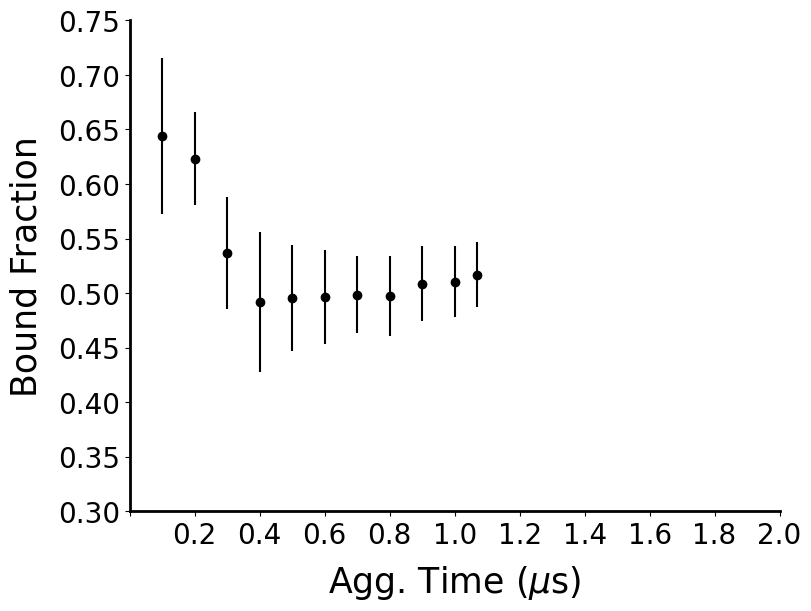

In [17]:
fig, axes = plt.subplots(1,1, figsize=(8,6), layout="constrained")

for time, bf in ag_kd.items():


    axes.scatter(float(time)/10**3,  bf[0], color='k')
    axes.errorbar(float(time)/10**3, bf[0], yerr=bf[1], color='k', ls='none')

axes.tick_params(labelsize=20)
axes.set_xticks(np.arange(0,2.2,0.2), [" "]+[f"{i:2.1f}" for i in np.arange(0.2,2.2,0.2)])
axes.set_yticks(np.arange(0.3,0.8,0.05), [f"{i:2.2f}" for i in np.arange(0.3,0.8,0.05)])

axes.set_xlabel(r'Agg. Time ($\mu$s)', size=25, labelpad=10)
axes.set_ylabel('Bound Fraction', size=25, labelpad=10)

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)
axes.spines['left'].set_linewidth(2)
axes.spines['bottom'].set_linewidth(2)


In [13]:
dist_300=np.loadtxt(f'{data_list_lig47[2]}/distances/colvar_0.dat', comments=['#','@']).T


In [14]:
dist_agg_fe={}
# time_agg=[]

for dist_no  in range(0, 6, 1):

    magic_num=125
    time_split=[]
    c=0
    d=[]
    
    for i in range(10,510,10):
    
        c=len(time[:int(magic_num*i)+1])
        last=time[:int(magic_num*i)+1][-1]
        # time_agg.append(last)

        if c in time_split : break

        time_split.append(c)
        # d.append(get_blockerror_pyblock_nanskip(np.array(dist_300[dist_no+1][:int(magic_num*i)+1])))
        d.append(free_energy_1D_blockerror(np.array(dist_300[dist_no+1][:int(magic_num*i)+1]), T=300, x0=0.5, xmax=2.25, bins=50, blocks=5,))

        # print(i, c, last, kd_bf_data[0])
        # print(dist_no, i, c, last)

        # print(f"Time ==> {last} microsec; Total frames ==> {c}; Rg ==> {dist_agg[int(i/10)-1][0]:0.4f}; Rg_err ==> {dist_agg[int(i/10)-1][1]:0.4f}")
    dist_agg_fe[dist_no]=np.array(d)

/home/jayakrishna/work/scripts/analysis_class/Block_analysis.py:90: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)


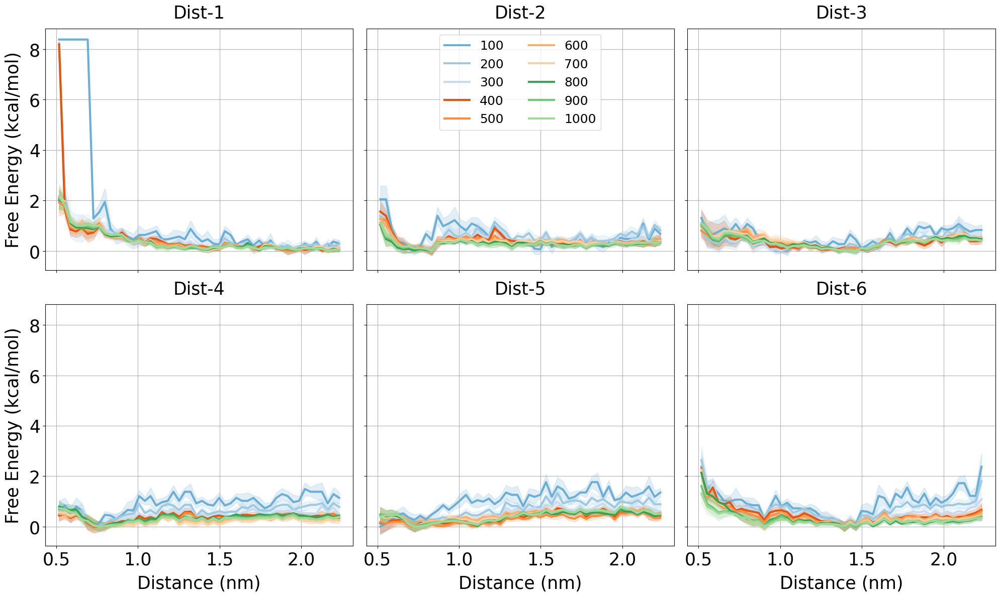

In [15]:
np.seterr(invalid='ignore')

fig, ax = plt.subplots(2, 3, figsize=(20, 12), sharex=True, sharey=True)

for d in range(0,6):

    p,q = np.unravel_index(d,(2,3))

    for i in range(100,1100, 100):
        dG1, bin_centers, ferr = dist_agg_fe[d][int(i/100)-1][0], dist_agg_fe[d][int(i/100)-1][1], dist_agg_fe[d][int(i/100)-1][2]

        sns.lineplot(x=bin_centers, y=dG1, color=plt.cm.tab20c(int(i/100)), linewidth=3,label=str(i), linestyle='-', ax=ax[p,q])
        ax[p,q].fill_between(bin_centers, dG1-ferr, dG1+ferr, color=plt.cm.tab20c(int(i/100)), alpha=0.2)

    ax[p,q].tick_params(labelsize=25)
    # ax[p,q].set_ylim(-0.2, 2)
    # ax[p,q].set_xlim(0.5, 2.25)
    ax[p,q].set_xlabel(f'Distance (nm)', size=25, labelpad=10)
    ax[p,q].set_ylabel('Free Energy (kcal/mol)', size=25, labelpad=10)
    if p==0 and q==1 : ax[p,q].legend(loc='upper center', fontsize=18, ncol=2)
    else : ax[p,q].legend().set_visible(False)
    ax[p,q].set_title(f'Dist-{d+1}', size=25, pad=15)
    ax[p,q].grid()


plt.tight_layout()

In [16]:
dist_agg={}
# time_agg=[]

for dist_no  in range(0, 6, 1):

    magic_num=125
    time_split=[]
    c=0
    d=[]
    
    for i in range(10,510,10):
    
        c=len(time[:int(magic_num*i)+1])
        last=time[:int(magic_num*i)+1][-1]
        # time_agg.append(last)

        if c in time_split : break

        time_split.append(c)
        d.append(get_blockerror_pyblock_nanskip(np.array(dist_300[dist_no+1][:int(magic_num*i)+1])))
        # print(i, c, last, kd_bf_data[0])
        # print(dist_no, i, c, last)

        # print(f"Time ==> {last} microsec; Total frames ==> {c}; Rg ==> {dist_agg[int(i/10)-1][0]:0.4f}; Rg_err ==> {dist_agg[int(i/10)-1][1]:0.4f}")

    dist_agg[dist_no]=np.array(d)

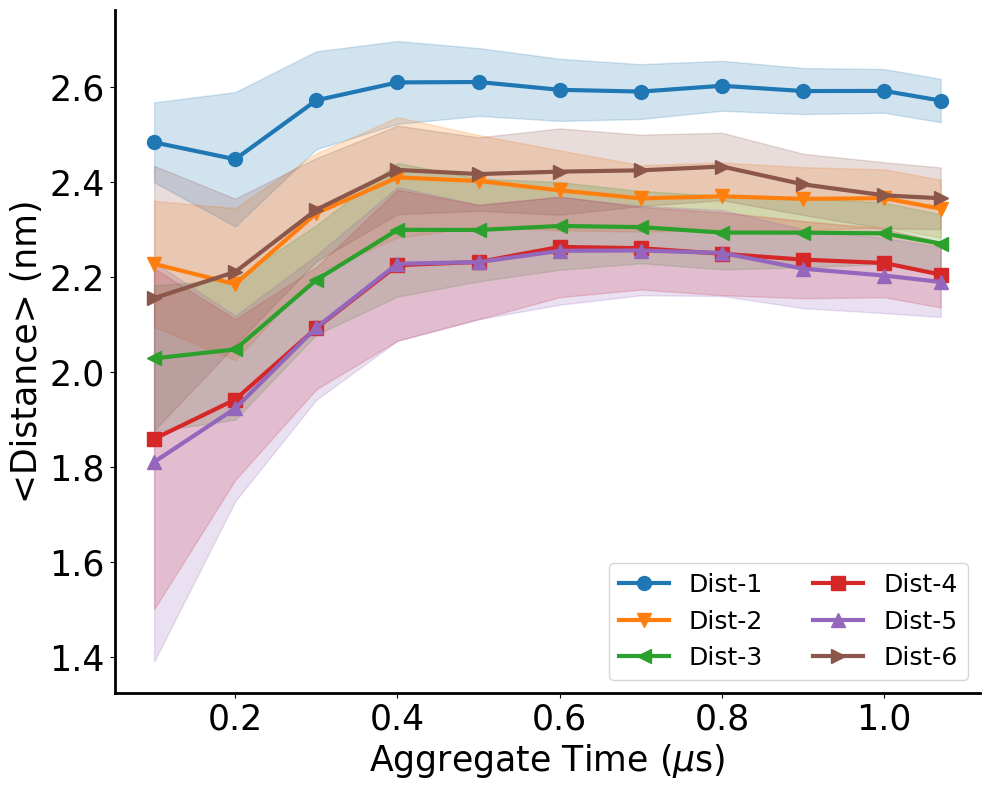

In [17]:
marker=['o','v','<', 's','^','>']

fig, ax = plt.subplots(figsize=(10,8))  # Create a figure and an axes

for d in range(0,6):
    # plt.errorbar(time_agg, dist_agg[d].T[0], yerr=dist_agg[d].T[1], fmt='o', color=plt.cm.tab10(d), markersize=10, capsize=5, capthick=2, label=f'Dist-{d+1}')
    ax.plot(time_agg, dist_agg[d].T[0], color=plt.cm.tab10(d), linewidth=3, label=f'Dist-{d+1}', marker=marker[d], markersize=10)
    ax.fill_between(time_agg, dist_agg[d].T[0]-dist_agg[d].T[1], dist_agg[d].T[0]+dist_agg[d].T[1], color=plt.cm.tab10(d), alpha=0.2)

ax.tick_params(labelsize=25)
ax.set_xlabel(r'Aggregate Time ($\mu$s)', size=25)
ax.set_ylabel(r'<Distance> (nm)', size=25)
ax.legend(fontsize=18, ncol=2)

ax.spines['right'].set_visible(False)
ax.spines['left'].set_linewidth(2)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_linewidth(2)

plt.tight_layout()

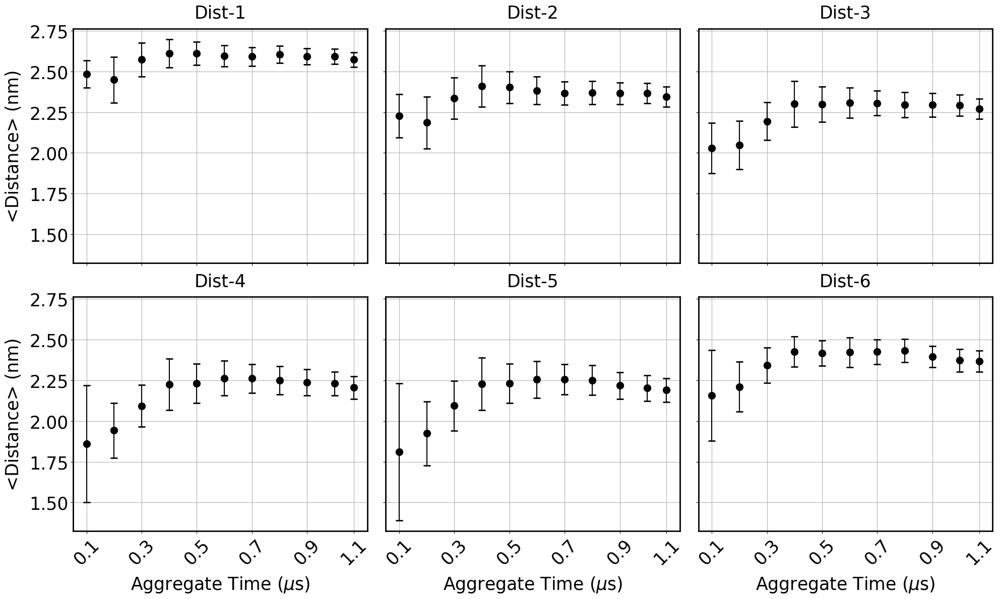

In [18]:
fig, ax = plt.subplots(2, 3, figsize=(20, 12), sharex=True, sharey=True)

for d in range(0,6):

    p,q = np.unravel_index(d,(2,3))

    ax[p,q].errorbar(time_agg, dist_agg[d].T[0], yerr=dist_agg[d].T[1], fmt='o', color='black', markersize=10, capsize=5, capthick=2)


    ax[p,q].tick_params(labelsize=25)
    # ax[p,q].set_ylim(-0.2, 2)
    # ax[p,q].set_xlim(0.5, 2.25)
    if p==1 : ax[p,q].set_xlabel(r'Aggregate Time ($\mu$s)', size=25, labelpad=10)
    if q==0 :ax[p,q].set_ylabel(r'<Distance> (nm)', size=25, labelpad=10)

    ax[p,q].set_title(f'Dist-{d+1}', size=25, pad=15)
    ax[p,q].grid()
    ax[p,q].spines['right'].set_linewidth(2)
    ax[p,q].spines['left'].set_linewidth(2)
    ax[p,q].spines['top'].set_linewidth(2)
    ax[p,q].spines['bottom'].set_linewidth(2)

    ax[p,q].set_xticks(time_agg[::2],[round(i,1) for i in time_agg[::2]],rotation=45)


plt.tight_layout()

In [19]:
pdb = '/data/jk_ssREST3_repo_data/xtc/ssREST3/pbc_lig47.pdb'
xtc = '/data/jk_ssREST3_repo_data/xtc/ssREST3/lig47_8/r/pbc_0.xtc'

traj = md.load(xtc, top=pdb)
traj.center_coordinates()

<mdtraj.Trajectory with 13370 frames, 338 atoms, 21 residues, and unitcells at 0x7ac2c8dca3d0>

In [20]:
magic_num=125
time_split=[]
c=0
p_cm_agg={}

for i in range(10,510,10):
    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)
    # p_cm_agg.append(contact_map_protein_rw(traj[:int(magic_num*i)+1]))
    p_cm_agg[int(i/10)-1]=contact_map_protein_rw(traj[:int(magic_num*i)+1])


    # print(i, c, last, kd_bf_data[0])
    # print(f"Time ==> {last} microsec; Total frames ==> {c}; Rg ==> {p_cm_agg[int(i/10)-1][0]:0.4f}; Rg_err ==> {p_cm_agg[int(i/10)-1][1]:0.4f}")
    print(last)

0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0
1.06952


In [21]:
plot_args={'vmin': 0.0,
           'vmax': 1.0,
           'fig_size': (10,28),
        #    'cax_coor': [.92, .11, .03, .77],
           'cmap': 'jet',
           'aspect' : 'auto',
           'rotation' : {'x' : 90, 'y' :0},
           'tick_size' : {'x' : 28, 'y' : 28, 'cax' :30},
           'label_size' : {'x' : 38, 'y' : 38, 'cax' :36},
           'title_size' :28,
           'dpi' : 210,
           'labels' : {'x' :"Residues", 'y':"Residues" },
           'nrows' : 6,
           'ncols' : 2,
           'xticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'yticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'tick_interval' : 1}

in_dict=p_cm_agg
_plot_cm_all(in_dict, 'Contact Fraction', show_fig=True, title_dict=[f'{i}' for i in time_agg], offset=1, 
             plot_args_in=plot_args)

In [22]:
magic_num=125
time_split=[]
c=0
l_cm_agg={}

for i in range(10,510,10):
    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)
    # p_cm_agg.append(contact_map_protein_rw(traj[:int(magic_num*i)+1]))
    l_cm_agg[int(i/10)-1]=contact_map_ligand_rw_2(traj[:int(magic_num*i)+1],ps=0, pe=19, ligand_res_index=20)


    # print(i, c, last, kd_bf_data[0])
    # print(f"Time ==> {last} microsec; Total frames ==> {c}; Rg ==> {p_cm_agg[int(i/10)-1][0]:0.4f}; Rg_err ==> {p_cm_agg[int(i/10)-1][1]:0.4f}")
    # print(last)

In [23]:
plot_args={'vmin': 0.0,
           'vmax': 0.5,
           'fig_size': (10,28),
        #    'cax_coor': [.92, .11, .03, .77],
           'cmap': 'jet',
           'aspect' : 'auto',
           'rotation' : {'x' : 90, 'y' :0},
           'tick_size' : {'x' : 28, 'y' : 28, 'cax' :30},
           'label_size' : {'x' : 38, 'y' : 38, 'cax' :36},
           'title_size' :28,
           'dpi' : 210,
           'labels' : {'x' :"Residues", 'y':"Residues" },
           'nrows' : 6,
           'ncols' : 2,
           'xticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'yticks' : [" "  if i%3 else ticks_pnum[i] for i in range(len(ticks_pname)) ],
           'tick_interval' : 1}

in_dict=l_cm_agg
_plot_cm_all(in_dict, 'Contact Fraction', show_fig=True, title_dict=[f'{i}' for i in time_agg], offset=1, 
             plot_args_in=plot_args)

Text(0.5, 0.9, '$\\alpha$-synuclein C-term : Ligand 47')

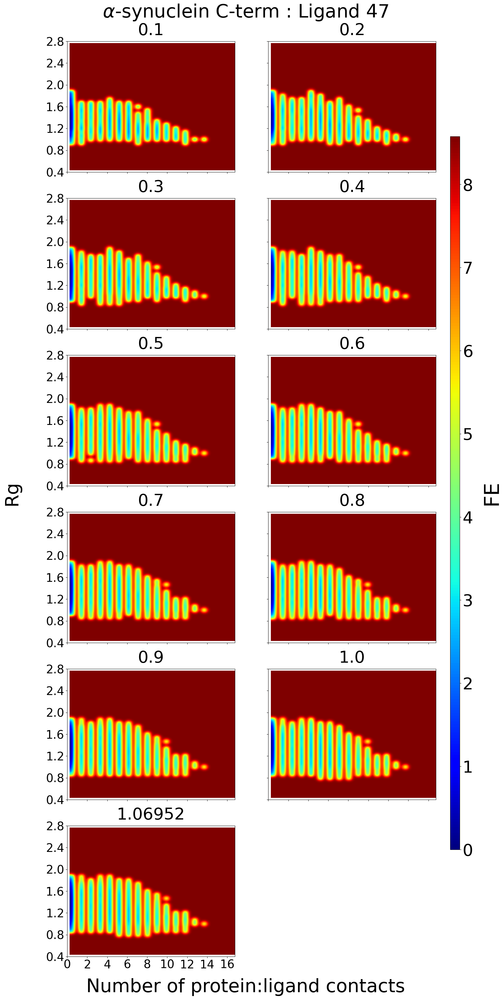

In [7]:
histogram_data={}

magic_num=125
time_split=[]
c=0

fig, axes = plt.subplots(6,2, figsize=(16,40), sharex=True, sharey=True)
cax= fig.add_axes([0.93, 0.2, 0.02, 0.6])
     

images=[]
for i in range(10,510,10):
    # ax.set_axis_off()

    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)

    # fe, xedges,yedges, histogram_data[i]  = free_energy_2D(Y=np.array(rg['rep:0'][:int(magic_num*i)+1]), X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1),
    #                                                        T=300,bins=35, 
    #                                                        y0=np.array(rg['rep:0'][:int(magic_num*i)+1]).min(), ymax=np.array(rg['rep:0'][:int(magic_num*i)+1]).max(), 
    #                                                        x0=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1).min(), xmax=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1).max())
    fe, xedges,yedges, histogram_data[i]  = free_energy_2D(Y=np.array(rg['rep:0'][:int(magic_num*i)+1]), X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1),
                                                           T=300,bins=35, 
                                                           y0=0.4, ymax=2.8, 
                                                           x0=0, xmax=17)
    
    p,q = np.unravel_index(int(i/10)-1,(6,2))
    im = axes[p,q].imshow(fe, cmap='jet', aspect='auto',
                          extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]],
                          interpolation='gaussian')
    
    # axes[p,q].invert_yaxis()
    axes[p,q].set_xticks(np.arange(0, 17, 2), np.arange(0, 17, 2), rotation=0, size=28)
    axes[p,q].set_yticks(np.arange(0.4, 3.0, 0.4), [round(i, 1) for i in np.arange(0.4, 3.0, 0.4)], rotation=0, size=28)
    axes[p,q].grid(False)
    axes[p,q].set_title(last,size=40, pad=15)

    # if not q : axes[p,q].set_ylabel("Residues", size=45, labelpad=15)
    # if p == 2-1 : axes[p,q].set_xlabel('Residues', size=45, labelpad=15)
    images.append(im)

for ax in axes.flat :

    if not bool(ax.has_data()):

        fig.delaxes(ax)

# cbar = fig.colorbar(images[-1],cax=cax, orientation="horizontal")
cbar = fig.colorbar(images[-1],cax=cax)

cbar.set_label("FE", size=50, labelpad=20)
cbar.ax.tick_params(labelsize=40)
# cbar.set_ticks([])
# cbar.set_ticklabels([])

fig.text(0.5, 0.080, "Number of protein:ligand contacts", ha="center", fontsize=45)
fig.text(-0.01, 0.5, "Rg", va="center", rotation="vertical", fontsize=45)

# plt.suptitle("Protein:protien contact matix",size=50 )
fig.text(0.5, 0.90, r'$\alpha$-synuclein C-term : Ligand 47', ha="center", fontsize=45)

# plt.grid(alpha=0.1)
# plt.tight_layout()
# plt.savefig(f"{out_dir}/p_cm.png", dpi=1000, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.pdf", dpi=1200, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.eps", dpi=1200, bbox_inches='tight')

# plt.show()
# plt.clf()

/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)
/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)
/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)
/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)
/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)
/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)
/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value encountered in divide
  ferr = -(0.001987*T)*(error / average)
/tmp/ipykernel_27225/2301762736.py:283: RuntimeWarning: invalid value

Text(0.5, 0.9, '$\\alpha$-synuclein C-term : Ligand 47')

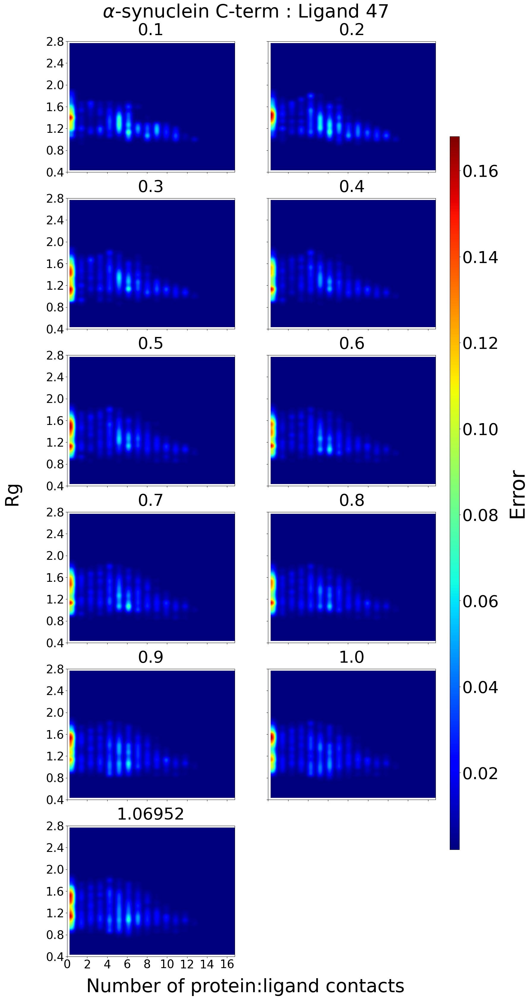

In [8]:
histogram_data={}

magic_num=125
time_split=[]
c=0

fig, axes = plt.subplots(6,2, figsize=(16,40), sharex=True, sharey=True)
cax= fig.add_axes([0.93, 0.2, 0.02, 0.6])
     

images=[]
for i in range(10,510,10):
    # ax.set_axis_off()

    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)

    # fe, xedges,yedges, histogram_data[i], err  = free_energy_2D_blockerror(Y=np.array(rg['rep:0'][:int(magic_num*i)+1]), X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1),
    #                                                        T=300,bins=35, 
    #                                                        y0=np.array(rg['rep:0'][:int(magic_num*i)+1]).min(), ymax=np.array(rg['rep:0'][:int(magic_num*i)+1]).max(), 
    #                                                        x0=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1).min(), xmax=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1).max())
    fe, xedges,yedges, histogram_data[i], err  = free_energy_2D_blockerror(Y=np.array(rg['rep:0'][:int(magic_num*i)+1]), X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1),
                                                           T=300,bins=35, 
                                                           y0=0.4, ymax=2.8, 
                                                           x0=0, xmax=17)
    
    p,q = np.unravel_index(int(i/10)-1,(6,2))
    im = axes[p,q].imshow(np.flip(adjust_min(err), 0), cmap='jet', aspect='auto',
                          extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]],
                          interpolation='gaussian')
    
    # axes[p,q].invert_yaxis()
    axes[p,q].set_xticks(np.arange(0, 17, 2), np.arange(0, 17, 2), rotation=0, size=28)
    axes[p,q].set_yticks(np.arange(0.4, 3.0, 0.4), [round(i, 1) for i in np.arange(0.4, 3.0, 0.4)], rotation=0, size=28)
    axes[p,q].grid(False)
    axes[p,q].set_title(last,size=40, pad=15)

    # if not q : axes[p,q].set_ylabel("Residues", size=45, labelpad=15)
    # if p == 2-1 : axes[p,q].set_xlabel('Residues', size=45, labelpad=15)
    images.append(im)

for ax in axes.flat :

    if not bool(ax.has_data()):

        fig.delaxes(ax)

# cbar = fig.colorbar(images[-1],cax=cax, orientation="horizontal")
cbar = fig.colorbar(images[-1],cax=cax)

cbar.set_label("Error", size=50, labelpad=20)
cbar.ax.tick_params(labelsize=40)
# cbar.set_ticks([])
# cbar.set_ticklabels([])

fig.text(0.5, 0.080, "Number of protein:ligand contacts", ha="center", fontsize=45)
fig.text(-0.01, 0.5, "Rg", va="center", rotation="vertical", fontsize=45)

# plt.suptitle("Protein:protien contact matix",size=50 )
fig.text(0.5, 0.90, r'$\alpha$-synuclein C-term : Ligand 47', ha="center", fontsize=45)

# plt.grid(alpha=0.1)
# plt.tight_layout()
# plt.savefig(f"{out_dir}/p_cm.png", dpi=1000, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.pdf", dpi=1200, bbox_inches='tight')
# plt.savefig(f"{out_dir}/p_cm.eps", dpi=1200, bbox_inches='tight')

# plt.show()
# plt.clf()

In [7]:
rg_bor=[0.5, 1.5, 2.5]
lc_bor=[0, 1, 7, 8, 12, 13, 17]


In [8]:
quad_data={}

magic_num=125
time_split=[]
c=0

for i in range(10,510,10):
    # ax.set_axis_off()
    c=len(time[:int(magic_num*i)+1])
    last=time[:int(magic_num*i)+1][-1]
    
    if c in time_split : break

    time_split.append(c)

    Y=np.array(rg['rep:0'][:int(magic_num*i)+1])
    X=np.sum(cm['rep:0'][:int(magic_num*i)+1], axis=1)


    q1_1d=np.zeros(len(X))
    q2_1d=np.zeros(len(X))
    q3_1d=np.zeros(len(X))
    q4_1d=np.zeros(len(X))
    q5_1d=np.zeros(len(X))
    q6_1d=np.zeros(len(X))
    q7_1d=np.zeros(len(X))

    index=0

    for rg_z,lc in zip(Y,X):

        if rg_bor[0]<=rg_z<=rg_bor[1] and lc_bor[0]==lc: q1_1d[index]=1
        else : q1_1d[index]=0

        if rg_bor[1]<rg_z<=rg_bor[2] and lc_bor[0]==lc: q2_1d[index]=1
        else : q2_1d[index]=0

        if rg_bor[0]<=rg_z<=rg_bor[1] and lc_bor[1]<=lc<=lc_bor[2]: q3_1d[index]=1
        else : q3_1d[index]=0

        if rg_bor[1]<rg_z<=rg_bor[2] and lc_bor[1]<=lc<=lc_bor[2]: q4_1d[index]=1
        else : q4_1d[index]=0

        if rg_bor[0]<=rg_z<=rg_bor[1] and lc_bor[3]<=lc<=lc_bor[4]: q5_1d[index]=1
        else : q5_1d[index]=0

        if rg_bor[1]<rg_z<=rg_bor[2] and lc_bor[3]<=lc<=lc_bor[4]: q6_1d[index]=1
        else : q6_1d[index]=0

        if rg_bor[0]<=rg_z<=rg_bor[1] and lc_bor[5]<=lc<=lc_bor[6]: q7_1d[index]=1
        else : q7_1d[index]=0

        index+=1

    quad_data[i] = [np.array(get_blockerror_pyblock_nanskip(q1_1d)), np.array(get_blockerror_pyblock_nanskip(q2_1d)), np.array(get_blockerror_pyblock_nanskip(q3_1d)), np.array(get_blockerror_pyblock_nanskip(q4_1d)),
                    np.array(get_blockerror_pyblock_nanskip(q5_1d)), np.array(get_blockerror_pyblock_nanskip(q6_1d)), np.array(get_blockerror_pyblock_nanskip(q7_1d))]
    quad_data[i] = np.array(quad_data[i])
    
    print(f'-----------------------------------------------------------------------------------------')
    print(f'{last} micros :')
    print(f'Q1 : {round(rg_bor[0],4)} <= rg_z <= {round(rg_bor[1], 4)} and {round(lc_bor[0], 4)} == lc : \nProb, B_err : {get_blockerror_pyblock_nanskip(q1_1d)}\n####')
    print(f'Q2 : {round(rg_bor[1],4)} < rg_z <= {round(rg_bor[2], 4)} and {round(lc_bor[0], 4)} == lc : \nProb, B_err : {get_blockerror_pyblock_nanskip(q2_1d)}\n####')
    print(f'Q3 : {round(rg_bor[0],4)} <= rg_z <= {round(rg_bor[1], 4)} and {round(lc_bor[1], 4)} <= lc <= {round(lc_bor[2], 4)} : \nProb, B_err : {get_blockerror_pyblock_nanskip(q3_1d)}\n####')
    print(f'Q4 : {round(rg_bor[1],4)} < rg_z <= {round(rg_bor[2], 4)} and {round(lc_bor[1], 4)} <= lc <= {round(lc_bor[2], 4)} : \nProb, B_err : {get_blockerror_pyblock_nanskip(q4_1d)}\n####')
    print(f'Q5 : {round(rg_bor[0],4)} <= rg_z <= {round(rg_bor[1], 4)} and {round(lc_bor[3], 4)} <= lc <= {round(lc_bor[4], 4)} : \nProb, B_err : {get_blockerror_pyblock_nanskip(q5_1d)}\n####')
    print(f'Q6 : {round(rg_bor[1],4)} < rg_z <= {round(rg_bor[2], 4)} and {round(lc_bor[3], 4)} <= lc <= {round(lc_bor[4], 4)} : \nProb, B_err : {get_blockerror_pyblock_nanskip(q6_1d)}\n####')
    print(f'Q7 : {round(rg_bor[0],4)} <= rg_z <= {round(rg_bor[1], 4)} and {round(lc_bor[5], 4)} <= lc <= {round(lc_bor[6], 4)} : \nProb, B_err : {get_blockerror_pyblock_nanskip(q7_1d)}\n')


-----------------------------------------------------------------------------------------
0.1 micros :
Q1 : 0.5 <= rg_z <= 1.5 and 0 == lc : 
Prob, B_err : (0.2653876898481215, 0.03881137538089319)
####
Q2 : 1.5 < rg_z <= 2.5 and 0 == lc : 
Prob, B_err : (0.0903277378097522, 0.020670386536742167)
####
Q3 : 0.5 <= rg_z <= 1.5 and 1 <= lc <= 7 : 
Prob, B_err : (0.4244604316546763, 0.11447045517259846)
####
Q4 : 1.5 < rg_z <= 2.5 and 1 <= lc <= 7 : 
Prob, B_err : (0.08233413269384493, 0.022554827226671282)
####
Q5 : 0.5 <= rg_z <= 1.5 and 8 <= lc <= 12 : 
Prob, B_err : (0.1334932054356515, 0.04632928873608645)
####
Q6 : 1.5 < rg_z <= 2.5 and 8 <= lc <= 12 : 
Prob, B_err : (0.0007993605115907274, 0.0008012820512820513)
####
Q7 : 0.5 <= rg_z <= 1.5 and 13 <= lc <= 17 : 
Prob, B_err : (0.0031974420463629096, 0.003289473684210526)

-----------------------------------------------------------------------------------------
0.2 micros :
Q1 : 0.5 <= rg_z <= 1.5 and 0 == lc : 
Prob, B_err : (0.2734